
## Install and import Libraries
> Add blockquote



In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Dense, Flatten, Reshape, LeakyReLU
from tensorflow.keras.models import Sequential
import matplotlib.pyplot as plt
import os

## Load and Normalize the MNIST Data

In [ ]:
# Load dataset
(X_train, _), (_, _) = tf.keras.datasets.mnist.load_data()

# Normalize between -1 and 1
X_train = (X_train.astype(np.float32) - 127.5) / 127.5
X_train = np.expand_dims(X_train, axis=-1)

BUFFER_SIZE = 60000
BATCH_SIZE = 128

dataset = tf.data.Dataset.from_tensor_slices(X_train).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)


11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


## Building Generator and Discriminator

In [ ]:
# Generator
def build_generator():
    model = Sequential([
        Dense(256, input_shape=(100,)),
        LeakyReLU(0.2),
        Dense(512),
        LeakyReLU(0.2),
        Dense(1024),
        LeakyReLU(0.2),
        Dense(784, activation='tanh'),
        Reshape((28, 28, 1))
    ])
    return model

# Discriminator
def build_discriminator():
    model = Sequential([
        Flatten(input_shape=(28, 28, 1)),
        Dense(512),
        LeakyReLU(0.2),
        Dense(256),
        LeakyReLU(0.2),
        Dense(1, activation='sigmoid')
    ])
    return model

# Instantiate models
generator = build_generator()
discriminator = build_discriminator()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
# Create instances of the generator and discriminator models
generator = build_generator()
discriminator = build_discriminator()

## Set up Loss Function & Optimizers

In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy()

generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

## Training Step

In [ ]:
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, 100])

    # --- Train Discriminator ---
    with tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        real_loss = cross_entropy(tf.ones_like(real_output), real_output)
        fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
        disc_loss = real_loss + fake_loss

    disc_grad = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    discriminator_optimizer.apply_gradients(zip(disc_grad, discriminator.trainable_variables))

    # --- Train Generator ---
    with tf.GradientTape() as gen_tape:
        generated_images = generator(noise, training=True)
        fake_output = discriminator(generated_images, training=True)
        gen_loss = cross_entropy(tf.ones_like(fake_output), fake_output)

    gen_grad = gen_tape.gradient(gen_loss, generator.trainable_variables)
    generator_optimizer.apply_gradients(zip(gen_grad, generator.trainable_variables))

    return gen_loss, disc_loss


## Generate and save Generated Image


In [ ]:
# Track losses
gen_losses = []
disc_losses = []

# Directory for saving generated images
os.makedirs("generated_images", exist_ok=True)

def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)
    fig = plt.figure(figsize=(5, 5))
    for i in range(predictions.shape[0]):
        plt.subplot(5, 5, i + 1)
        plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
        plt.axis('off')
    plt.suptitle(f"Epoch {epoch}")
    plt.tight_layout()
    plt.savefig(f"generated_images/image_epoch_{epoch:03d}.png")
    plt.show()
    plt.close()


## Execute the Traing Loop

In [ ]:
def train(dataset, epochs=50):
    seed = tf.random.normal([25, 100])  # fixed noise vector for visualization

    for epoch in range(epochs):
        for image_batch in dataset:
            gen_loss, disc_loss = train_step(image_batch)

        # Track loss
        gen_losses.append(gen_loss.numpy())
        disc_losses.append(disc_loss.numpy())

        # Status
        print(f'Epoch {epoch + 1}, Generator Loss: {gen_loss:.4f}, Discriminator Loss: {disc_loss:.4f}')
        generate_and_save_images(generator, epoch + 1, seed)


Epoch 1, Generator Loss: 2.5623, Discriminator Loss: 0.8483


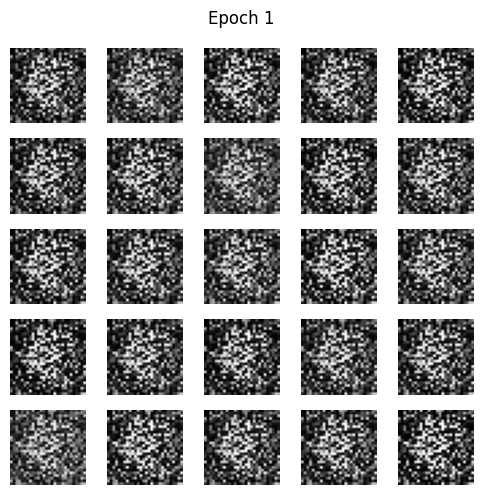

Epoch 2, Generator Loss: 2.9693, Discriminator Loss: 0.4324


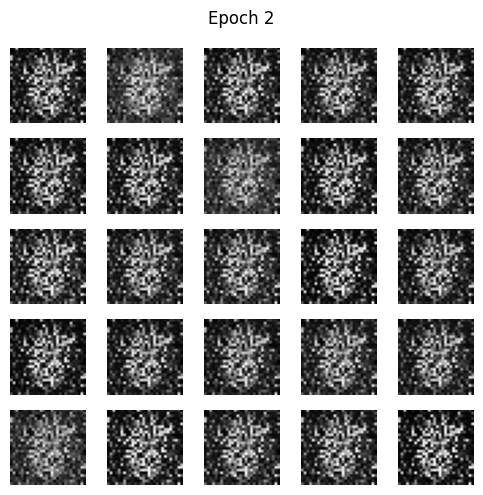

Epoch 3, Generator Loss: 2.3121, Discriminator Loss: 0.6791


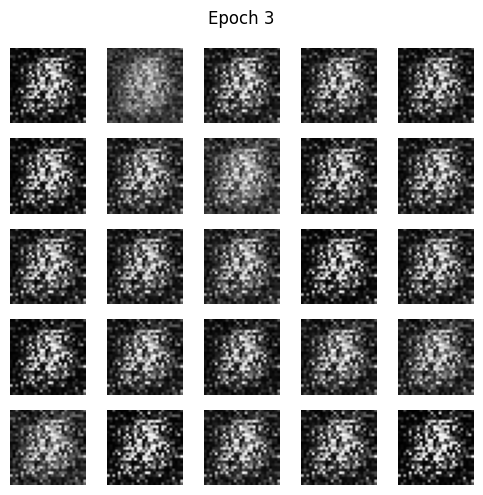

Epoch 4, Generator Loss: 2.1661, Discriminator Loss: 0.6374


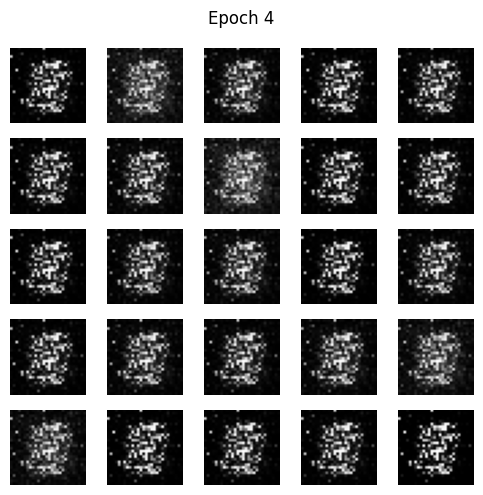

Epoch 5, Generator Loss: 2.2254, Discriminator Loss: 0.7350


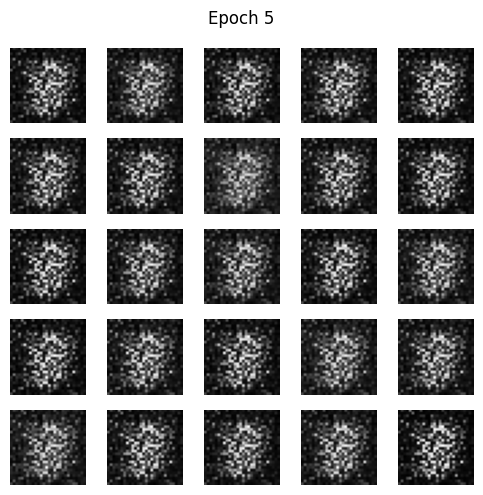

Epoch 6, Generator Loss: 1.5507, Discriminator Loss: 1.5588


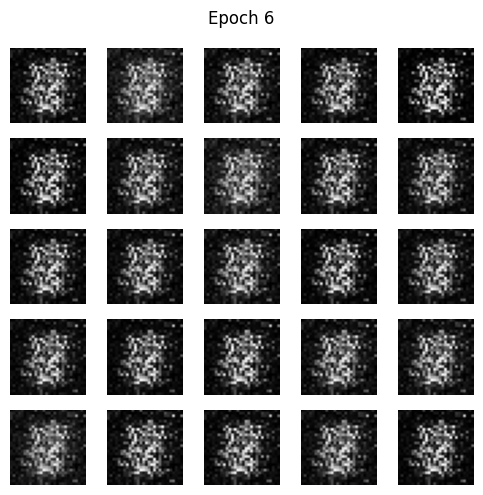

Epoch 7, Generator Loss: 1.4725, Discriminator Loss: 1.1612


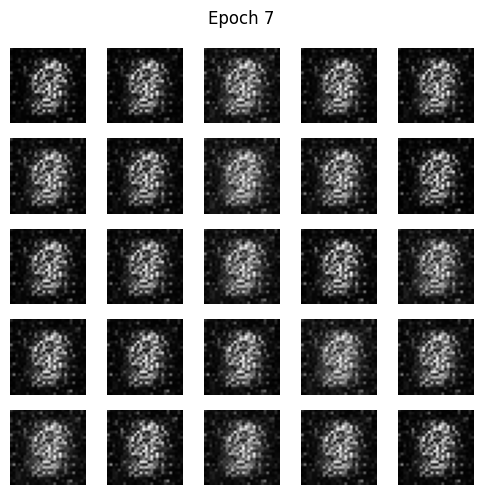

Epoch 8, Generator Loss: 2.7662, Discriminator Loss: 0.5500


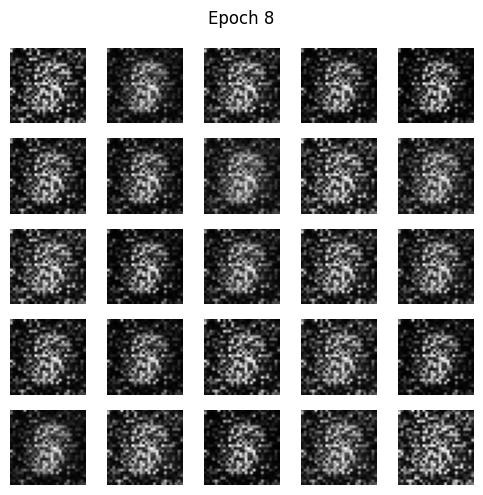

Epoch 9, Generator Loss: 1.7931, Discriminator Loss: 0.9769


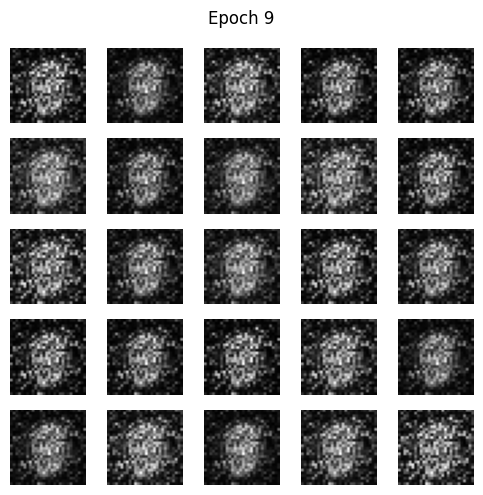

Epoch 10, Generator Loss: 3.0041, Discriminator Loss: 0.4755


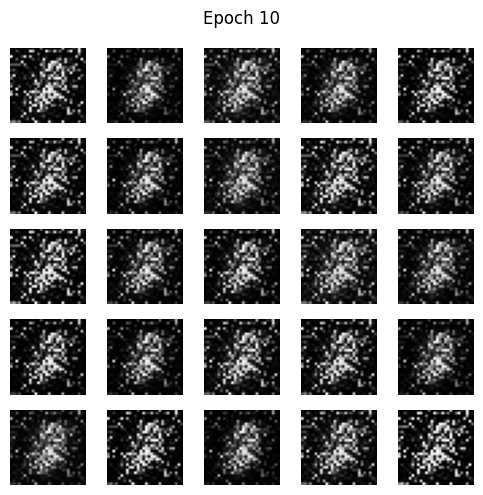

Epoch 11, Generator Loss: 1.8615, Discriminator Loss: 0.8598


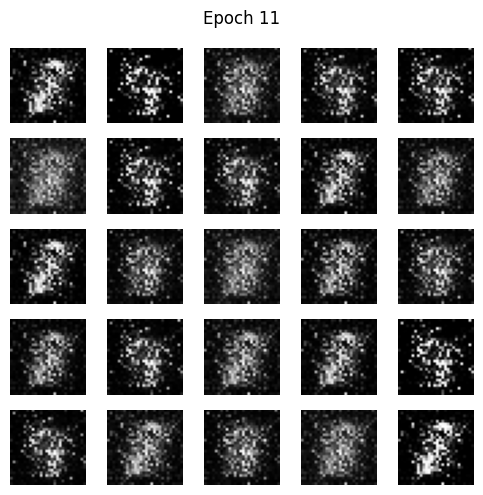

Epoch 12, Generator Loss: 2.7746, Discriminator Loss: 0.4190


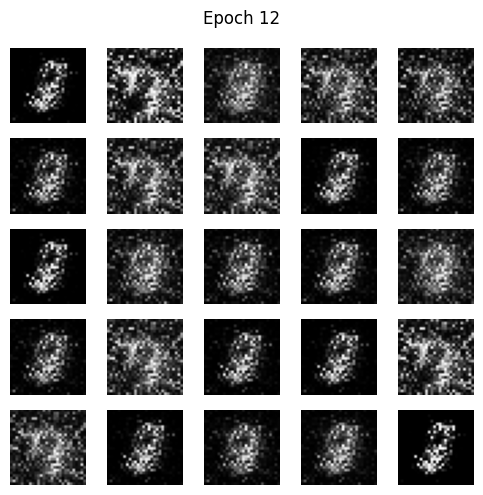

Epoch 13, Generator Loss: 2.8877, Discriminator Loss: 0.5355


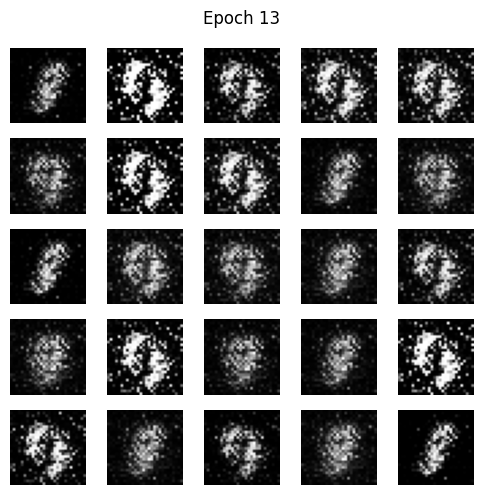

Epoch 14, Generator Loss: 2.3654, Discriminator Loss: 0.4782


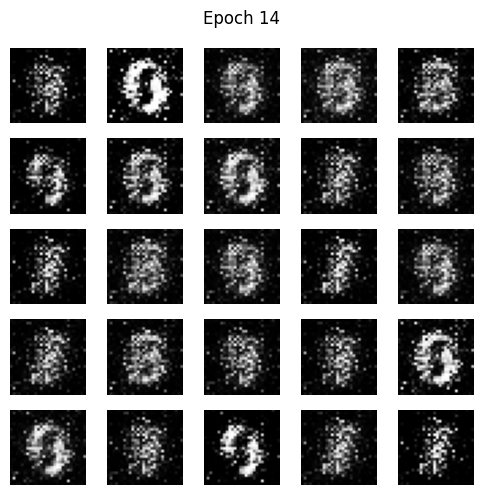

Epoch 15, Generator Loss: 3.9969, Discriminator Loss: 0.3278


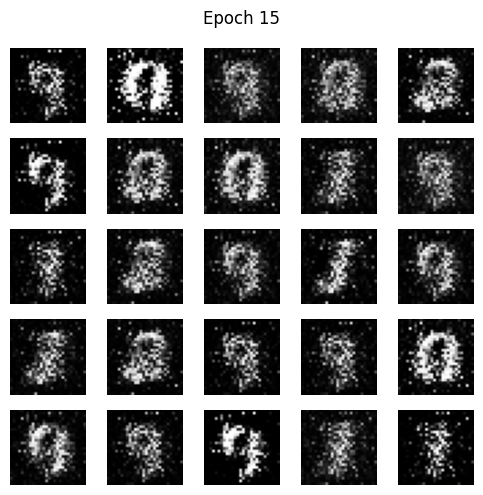

Epoch 16, Generator Loss: 5.6989, Discriminator Loss: 0.5365


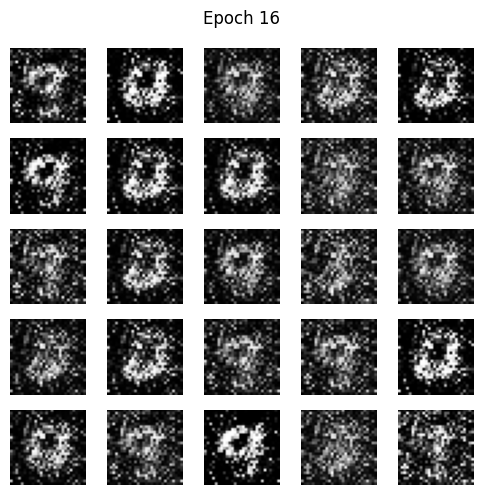

Epoch 17, Generator Loss: 3.4092, Discriminator Loss: 0.7413


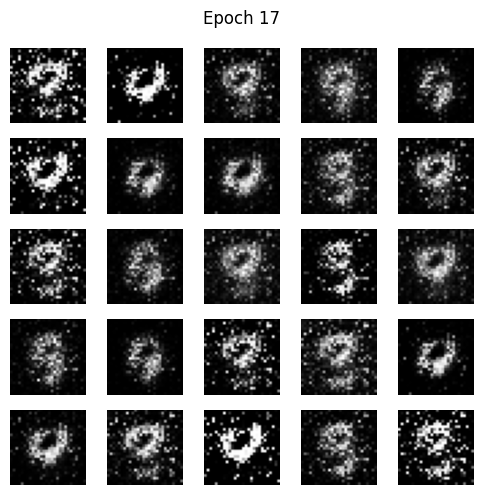

Epoch 18, Generator Loss: 2.8185, Discriminator Loss: 0.6578


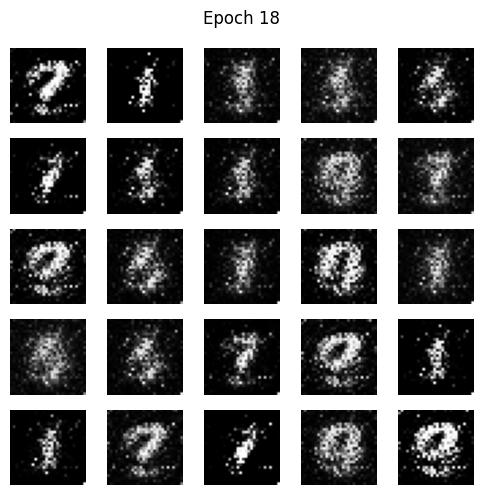

Epoch 19, Generator Loss: 3.0869, Discriminator Loss: 0.3821


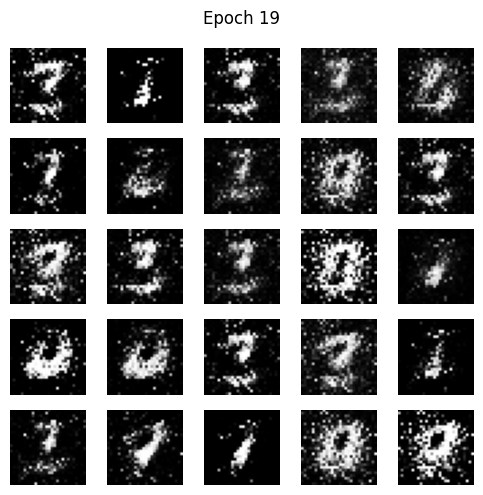

Epoch 20, Generator Loss: 2.9440, Discriminator Loss: 0.5858


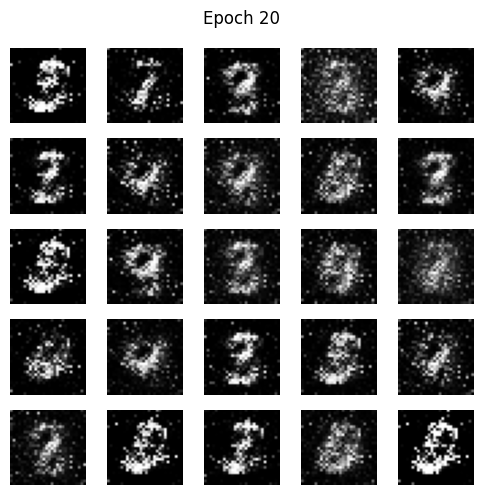

Epoch 21, Generator Loss: 2.8538, Discriminator Loss: 0.5361


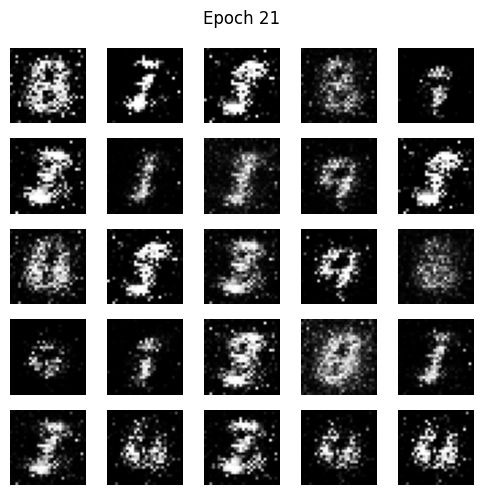

Epoch 22, Generator Loss: 3.2052, Discriminator Loss: 0.6436


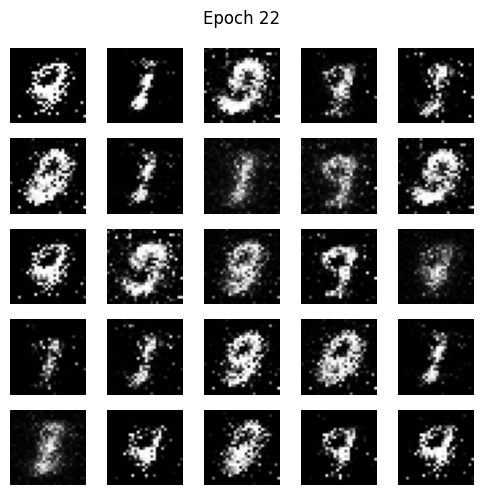

Epoch 23, Generator Loss: 3.2349, Discriminator Loss: 0.3958


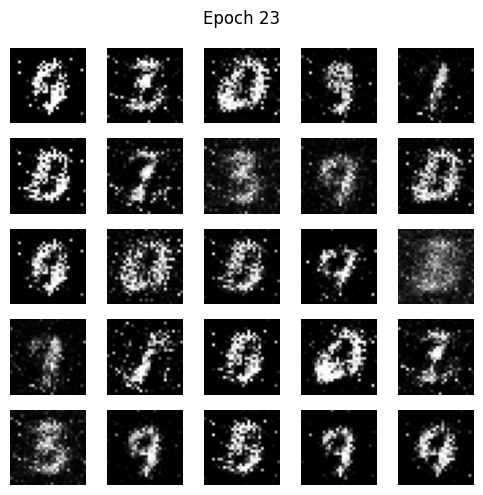

Epoch 24, Generator Loss: 3.7090, Discriminator Loss: 0.3898


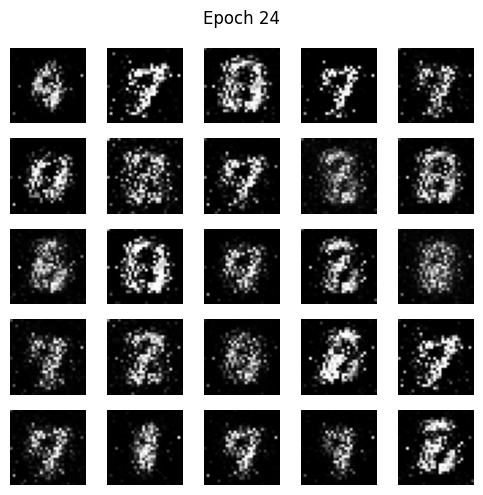

Epoch 25, Generator Loss: 3.4718, Discriminator Loss: 0.3449


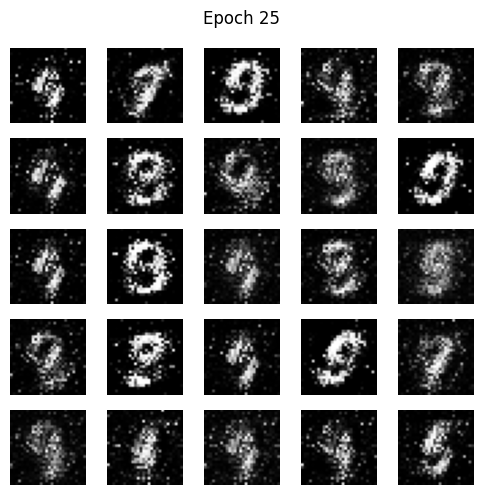

Epoch 26, Generator Loss: 2.4916, Discriminator Loss: 0.5119


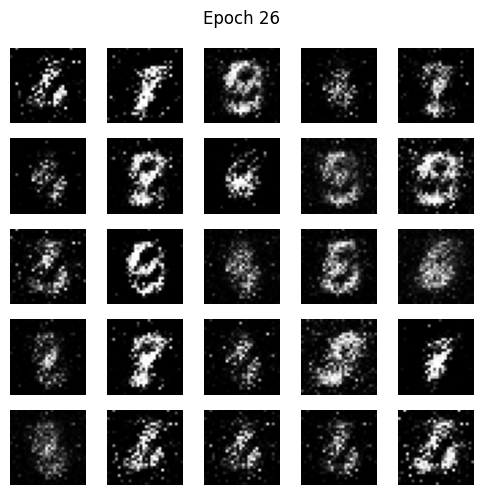

Epoch 27, Generator Loss: 3.5315, Discriminator Loss: 0.3663


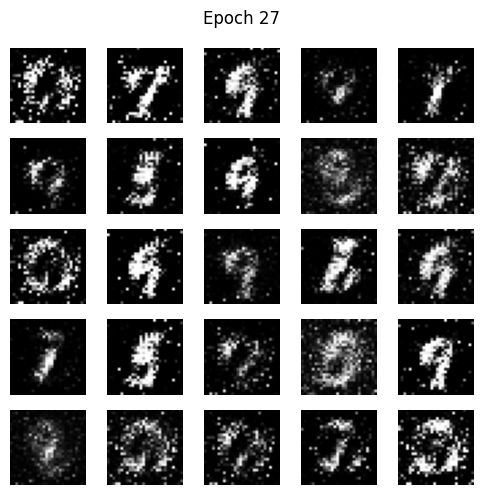

Epoch 28, Generator Loss: 4.3414, Discriminator Loss: 0.6461


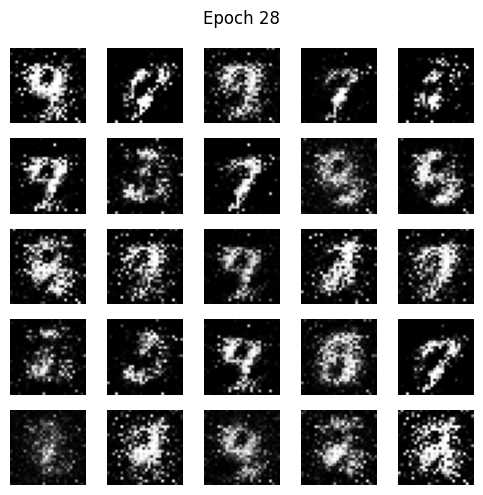

Epoch 29, Generator Loss: 4.8150, Discriminator Loss: 0.2648


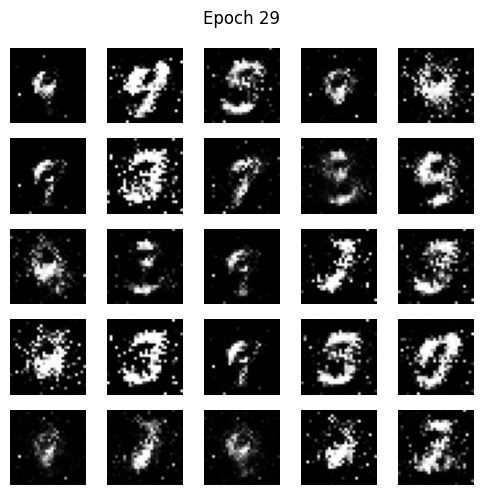

Epoch 30, Generator Loss: 3.1785, Discriminator Loss: 0.5114


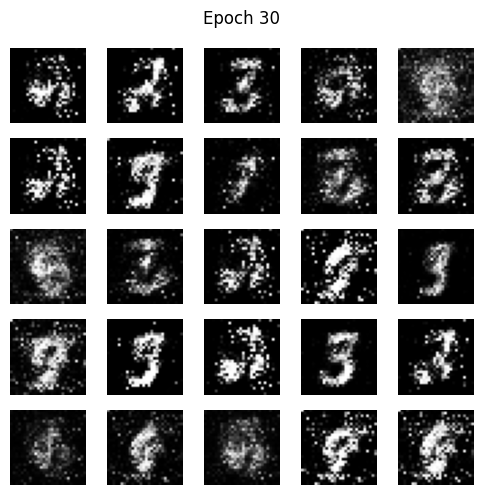

Epoch 31, Generator Loss: 3.0376, Discriminator Loss: 0.4821


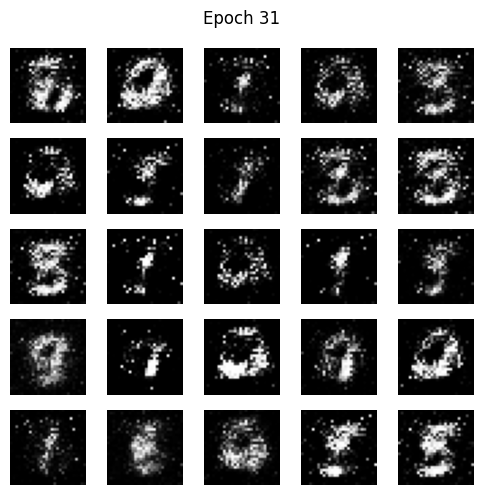

Epoch 32, Generator Loss: 3.1528, Discriminator Loss: 0.6184


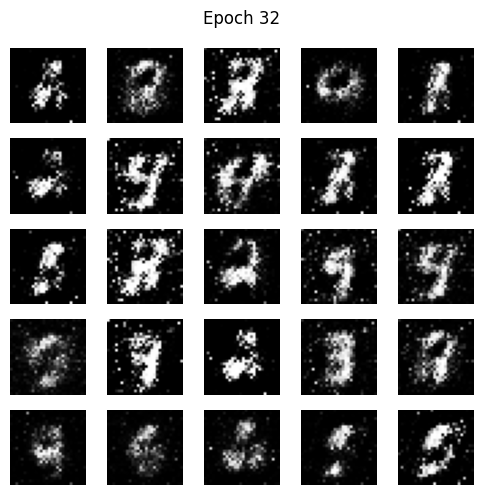

Epoch 33, Generator Loss: 3.8762, Discriminator Loss: 0.4504


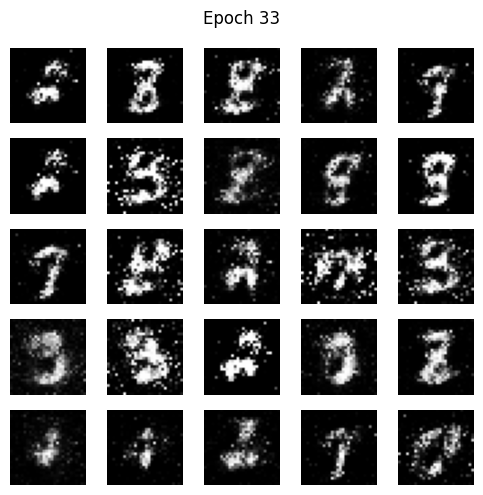

Epoch 34, Generator Loss: 3.0350, Discriminator Loss: 0.9360


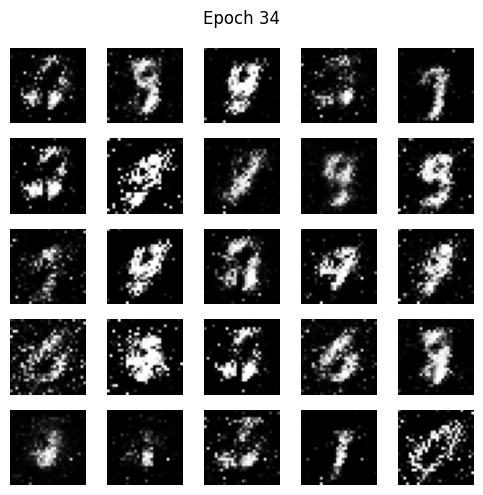

Epoch 35, Generator Loss: 2.6487, Discriminator Loss: 0.4221


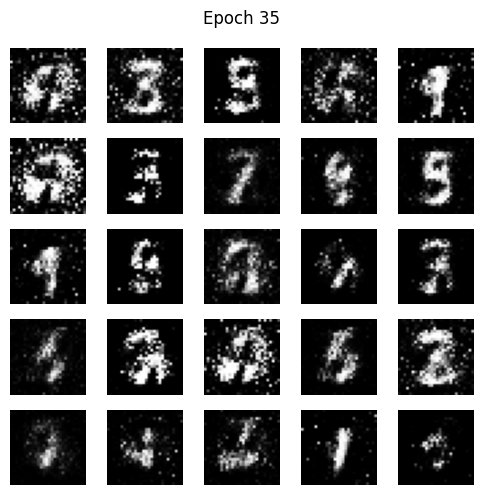

Epoch 36, Generator Loss: 2.4700, Discriminator Loss: 0.4314


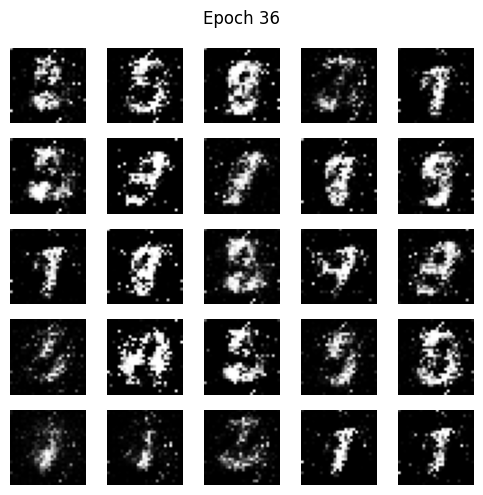

Epoch 37, Generator Loss: 3.1927, Discriminator Loss: 0.4762


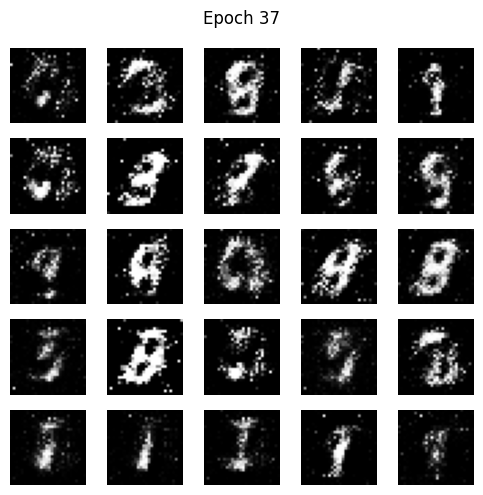

Epoch 38, Generator Loss: 3.0704, Discriminator Loss: 0.3877


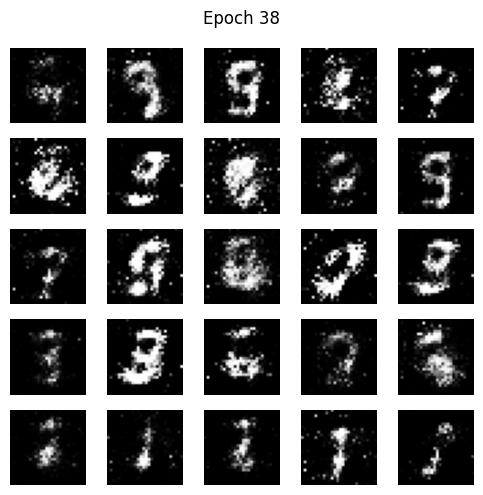

Epoch 39, Generator Loss: 2.4016, Discriminator Loss: 0.5265


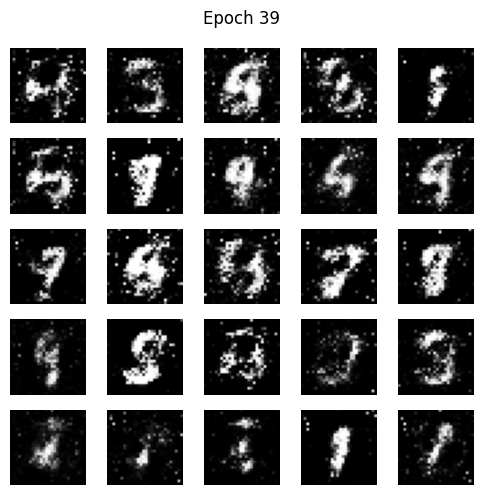

Epoch 40, Generator Loss: 3.1478, Discriminator Loss: 0.4742


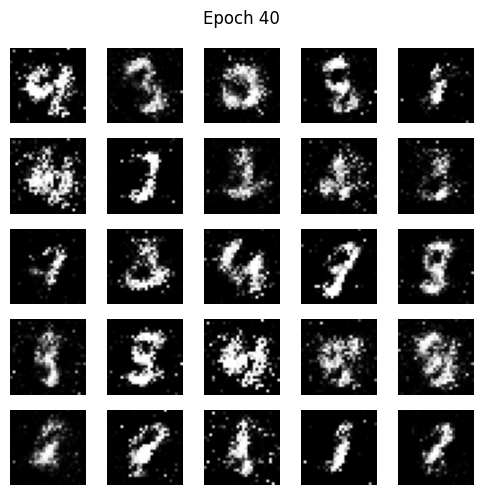

Epoch 41, Generator Loss: 2.8637, Discriminator Loss: 0.7066


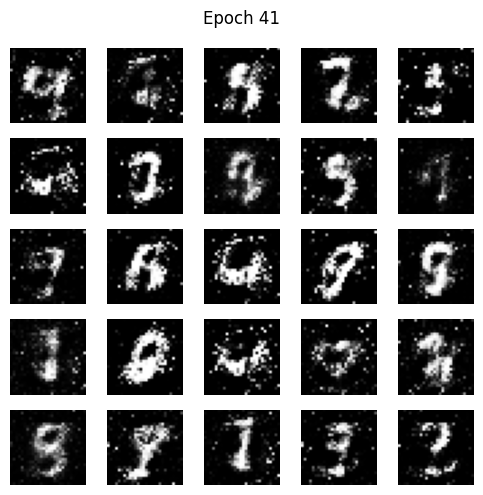

Epoch 42, Generator Loss: 3.6422, Discriminator Loss: 0.5652


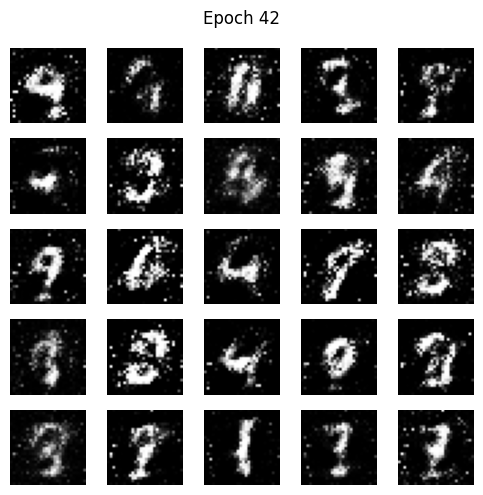

Epoch 43, Generator Loss: 2.3408, Discriminator Loss: 0.7985


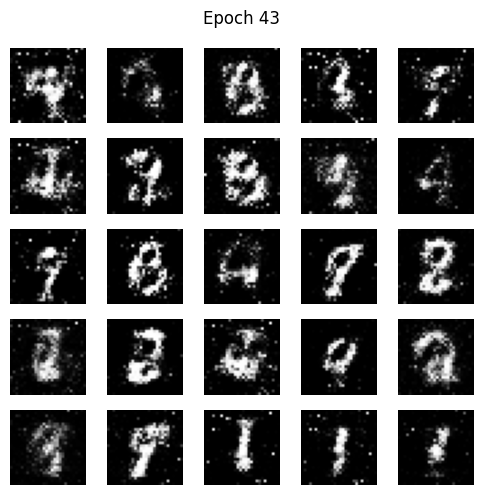

Epoch 44, Generator Loss: 2.1935, Discriminator Loss: 0.5451


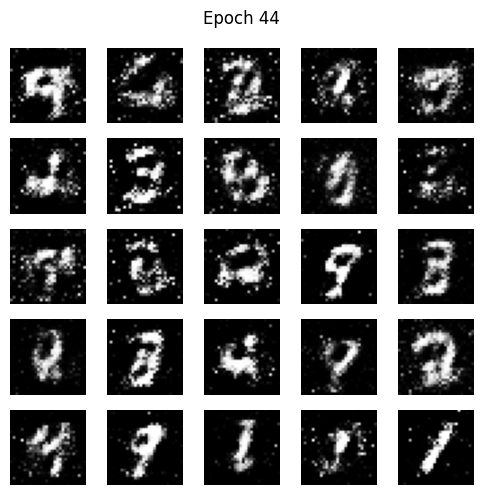

Epoch 45, Generator Loss: 2.1395, Discriminator Loss: 0.5510


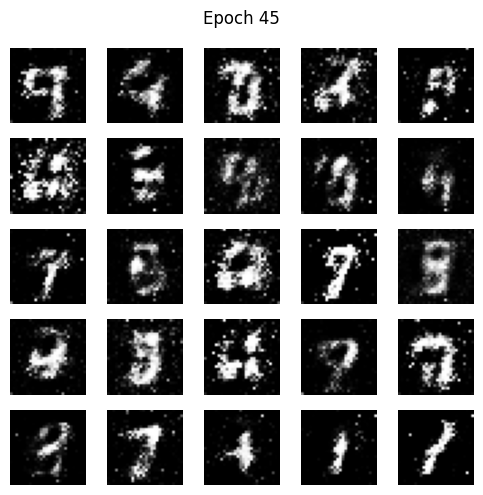

Epoch 46, Generator Loss: 2.7036, Discriminator Loss: 0.5060


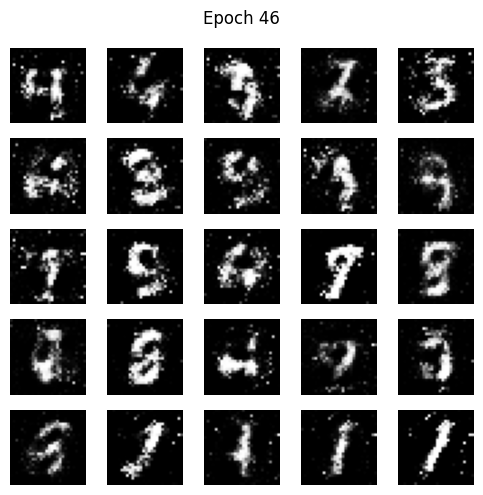

Epoch 47, Generator Loss: 3.1143, Discriminator Loss: 0.6325


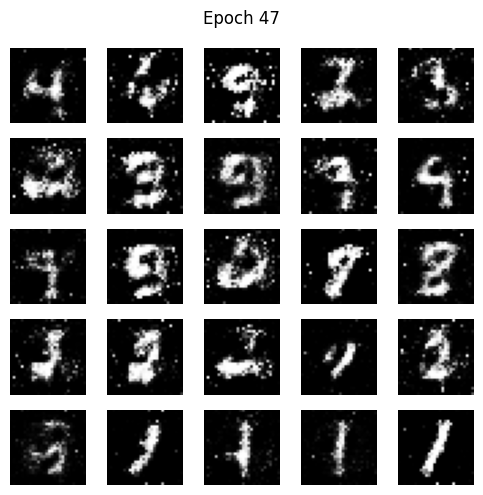

Epoch 48, Generator Loss: 2.3789, Discriminator Loss: 0.5525


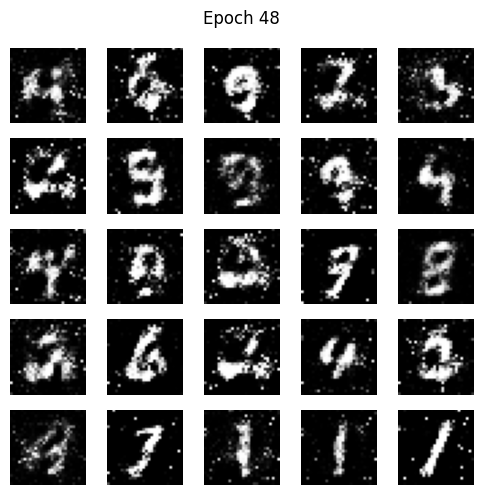

Epoch 49, Generator Loss: 2.6096, Discriminator Loss: 0.6536


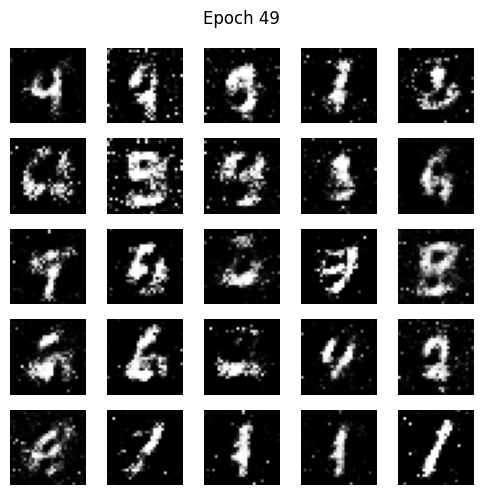

Epoch 50, Generator Loss: 2.9433, Discriminator Loss: 0.5257


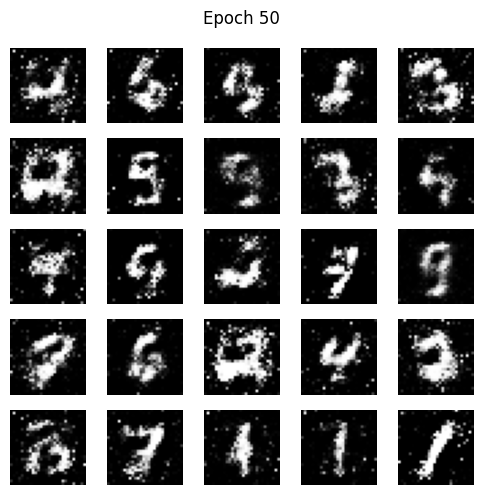

In [ ]:
train(dataset,epochs= 50)

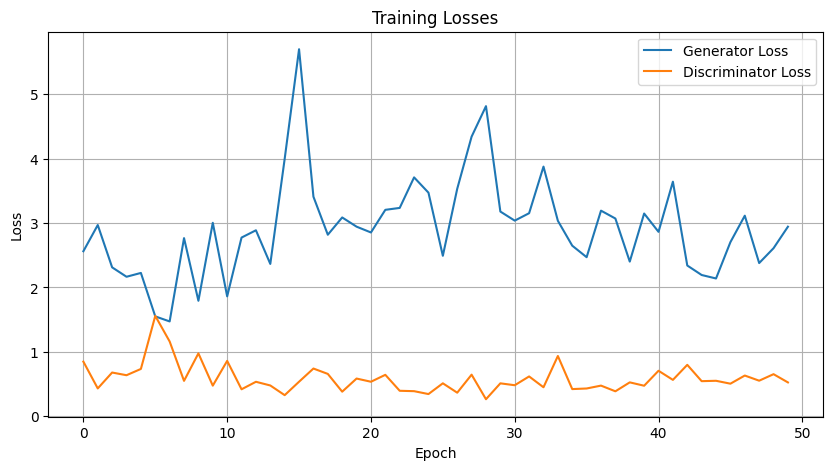

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(gen_losses, label='Generator Loss')
plt.plot(disc_losses, label='Discriminator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title("Training Losses")
plt.legend()
plt.grid(True)
plt.show()

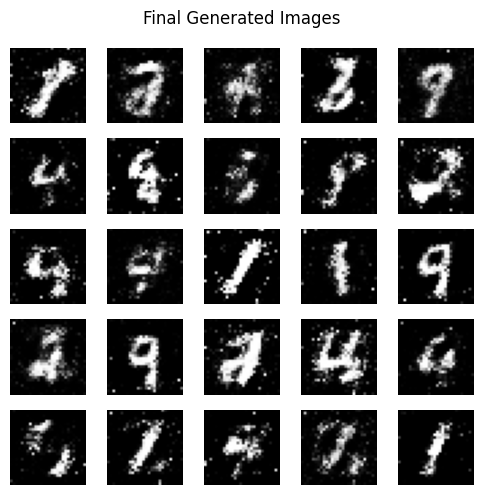

In [ ]:
def display_generated_images():
    noise = tf.random.normal([25, 100])
    generated_images = generator(noise, training=False)

    fig = plt.figure(figsize=(5, 5))
    for i in range(25):
        plt.subplot(5, 5, i + 1)
        plt.imshow(generated_images[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
        plt.axis('off')

    plt.suptitle("Final Generated Images")
    plt.tight_layout()
    plt.show()

display_generated_images()

In [ ]:
def evlute_disc():
  noise = tf.random.normal([100, 100])
  generated_images = generator(noise, training=False)
  real_image = next(iter(dataset))

  real_output = discriminator(real_image, training=False)
  fake_output = discriminator(generated_images, training=False)

  real_acc = tf.reduce_mean(tf.cast(real_output > 0.5, tf.float32))
  fake_acc = tf.reduce_mean(tf.cast(fake_output < 0.5, tf.float32))

  print(f'Real Accuracy: {real_acc:.4f}, Fake Accuracy: {fake_acc:.4f}')

evlute_disc()

Real Accuracy: 0.8281, Fake Accuracy: 0.9100
